In [40]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib
import time
from sklearn.model_selection import cross_val_score,train_test_split, GridSearchCV, cross_val_predict
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline, FunctionTransformer, make_pipeline
from sklearn.preprocessing import StandardScaler,PolynomialFeatures, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, ElasticNet, SGDRegressor, Ridge, Lasso,LogisticRegression
from sklearn.metrics import mean_squared_error, accuracy_score, precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.compose import ColumnTransformer

# EXAMEN

## EJERCICIO 1

Carga el conjunto de datos Iris (el de las flores según la anchura y la altura del pétalo y del sépalo) desde scikit-learn (se ha hecho en algún ejercicio).

Explora los datos visualmente utilizando gráficos: representa la distribución de cada variable (todas las de X e y), diagramas de cajas de cada variable (todas las de X) y la matriz de correlaciones para entender las relaciones entre las características. ¿Qué puedes deducir?

Divide el conjunto de datos en entrenamiento y prueba, estratificando por el tipo de flor.

Prepara los datos mediante una pipeline.

Entrena y evalúa un clasificador Random Forest utilizando validación cruzada. ¿Qué métrica has usado para evaluar el modelo y por qué? ¿Cuál es el mejor y el peor error que consigues?

Optimiza el número de árboles, ¿cuál es el mejor valor?

Evalúa el rendimiento del modelo optimizado en el conjunto de prueba.

Guarda el modelo en un fichero y cárgalo desde un fichero .py que pida 4 datos para una nueva flor (anchura del pétalo, longitud del pétalo, anchura del sépalo y longitud del sépalo) y prediga de que clase es la flor (quiero que me de un nombre, no un número y hay que controlar las excepciones).

### Obtener y Explorar datos

In [3]:
# cargar datos
iris = load_iris(as_frame=True)
X = iris.data
y = iris.target

In [4]:
X.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [24]:
X.columns

Index(['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)',
       'petal width (cm)'],
      dtype='object')

In [5]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [6]:
y.value_counts()

target
0    50
1    50
2    50
Name: count, dtype: int64

In [7]:
y.info()

<class 'pandas.core.series.Series'>
RangeIndex: 150 entries, 0 to 149
Series name: target
Non-Null Count  Dtype
--------------  -----
150 non-null    int64
dtypes: int64(1)
memory usage: 1.3 KB


In [8]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
dtypes: float64(4)
memory usage: 4.8 KB


In [9]:
X.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [10]:
df = X.copy()
df['tipo'] = y
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),tipo
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


/tmp/ipykernel_3148/3274327002.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  sns.countplot(data=df,x='tipo',ax=ax[i]).set_xticklabels(labels=['Tipo_1','Tipo_2','Tipo_3'])


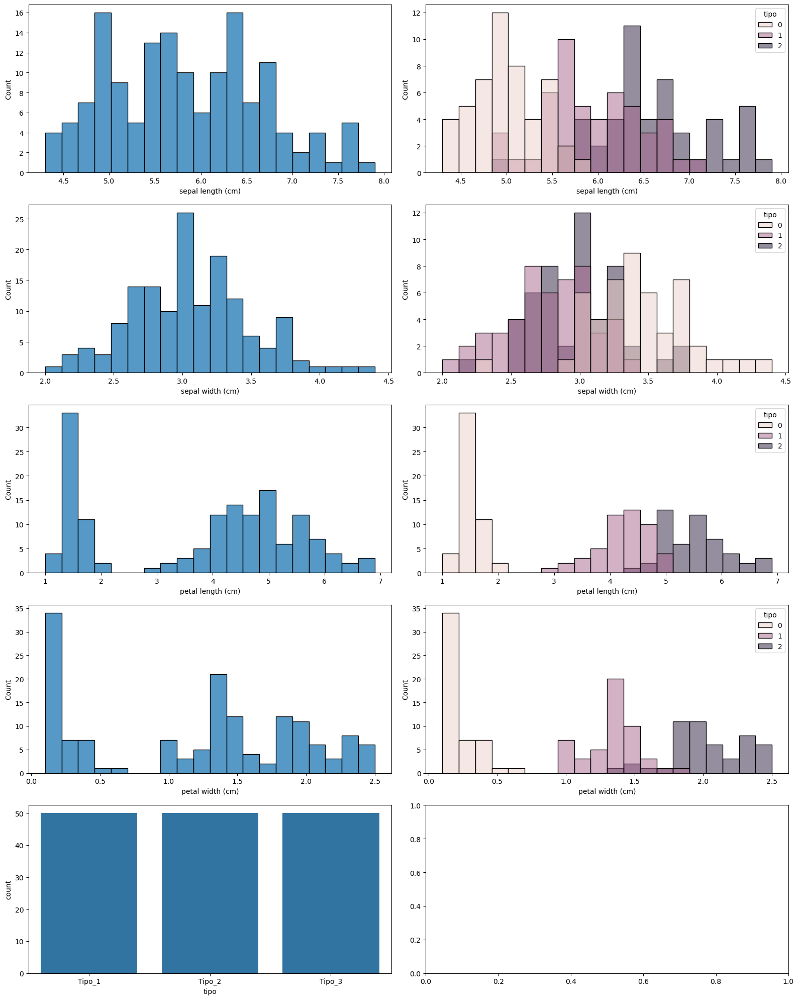

In [11]:
fig, ax = plt.subplots(5, 2, figsize=(16, 20))
ax = ax.flatten()
cols_disc = df.select_dtypes(include=['float64'])
i = 0
for col in cols_disc.columns:
    sns.histplot(data=df, x=col, ax=ax[i], bins=20, legend=None)
    i+=1
    sns.histplot(data=df, x=col, ax=ax[i], bins=20, hue='tipo')
    i+=1
sns.countplot(data=df,x='tipo',ax=ax[i]).set_xticklabels(labels=['Tipo_1','Tipo_2','Tipo_3'])
# Para que no se me junten
plt.tight_layout()
plt.show()

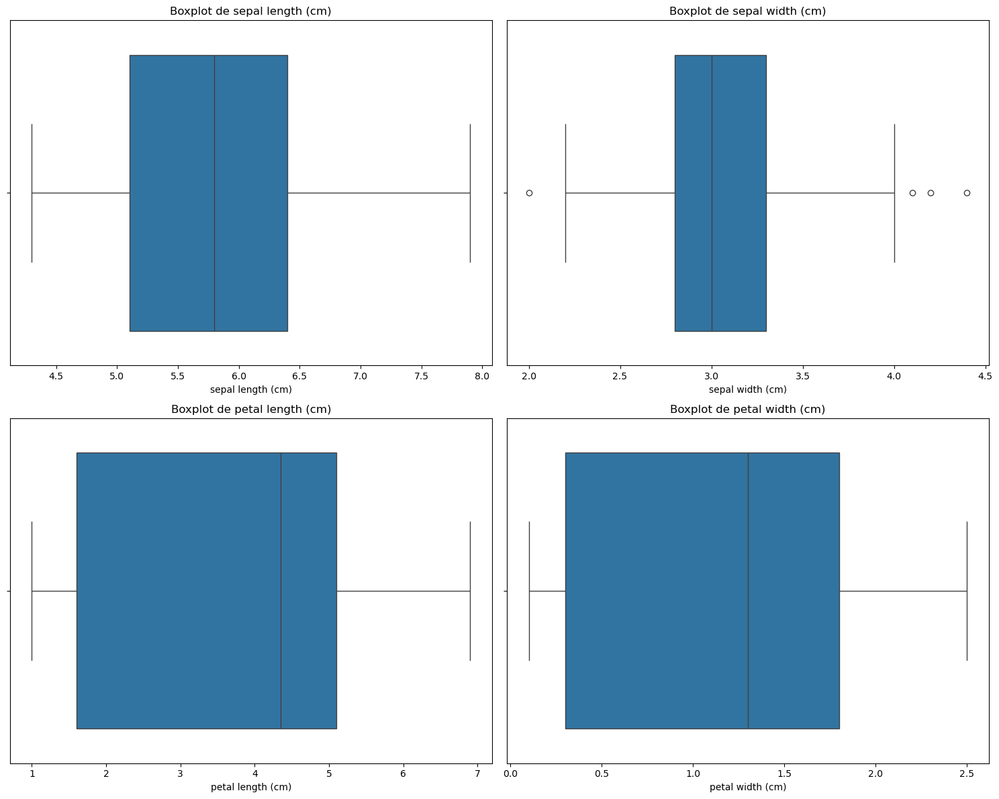

In [12]:
# Seleccionar las columnas numéricas
num_cols = df.select_dtypes(include=['float64']).columns

fig, axes = plt.subplots(2,2, figsize=(15, 12))
axes = axes.flatten()

# Crear boxplots para las columnas numéricas
for i in range(len(num_cols)):
    sns.boxplot(data=df, x=num_cols[i], ax=axes[i])
    axes[i].set_title(f"Boxplot de {num_cols[i]}")


plt.tight_layout()
plt.show()

In [13]:
corr_matrix = df.corr(numeric_only=True)
corr_matrix.style.background_gradient()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),tipo
sepal length (cm),1.000000,-0.117570,0.871754,0.817941,0.782561
sepal width (cm),-0.117570,1.000000,-0.428440,-0.366126,-0.426658
petal length (cm),0.871754,-0.428440,1.000000,0.962865,0.949035
petal width (cm),0.817941,-0.366126,0.962865,1.000000,0.956547
tipo,0.782561,-0.426658,0.949035,0.956547,1.000000


#### Deducciones
- Los tipos de los datos estan balanceados
- Todas la variables tienen buena correlacion con el tipo 
- Sabiendo que los tipos son 0, 1 y 2, los tipos 1 y 2 son los que comparten más similitudes entre ellos
- Hay algunos datos fuera de rango tanto por encima como por debajo de sepal width

#### Dividir datos

In [14]:
train_set_x, test_set_x, train_set_y, test_set_y = train_test_split(X,y,
                            test_size=0.15, random_state=42,
                            stratify=y)

#### Preparar


In [15]:
# rellenamos y standarizamos 
pipeline = make_pipeline(SimpleImputer(strategy='mean'),StandardScaler())

#meter los datos a la pipeline
train_set_prep = pipeline.fit_transform(train_set_x)

#pasar los datos a dataframe
pipeline_column = pipeline.get_feature_names_out()  
df_train_set = pd.DataFrame(train_set_prep, columns=pipeline_column)
df_train_set.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,0.424234,-0.585052,0.593670,0.787559
1,-1.491419,0.774124,-1.329412,-1.176185
2,1.022876,0.094536,1.046160,1.573057
3,-1.132234,-0.131994,-1.329412,-1.307101
4,0.065049,0.321065,0.593670,0.787559


#### Entrena y evalúa 
un clasificador Random Forest utilizando validación cruzada. ¿Qué métrica has usado para evaluar el modelo y por qué? ¿Cuál es el mejor y el peor error que consigues?

In [16]:
modeloRFC = RandomForestClassifier(random_state=42,n_estimators=17)
full_pipeline = make_pipeline(pipeline,modeloRFC)

# validacion cruzada
train_y_predict = cross_val_predict(full_pipeline, train_set_x, train_set_y, cv=5)

# metricas
exactitud = accuracy_score(train_set_y, train_y_predict)
precision = precision_score(train_set_y, train_y_predict, average='macro')
sensibilidad = recall_score(train_set_y, train_y_predict, average='macro')
f1 = f1_score(train_set_y, train_y_predict, average='macro')

print(' Exactitud: {}\n Precision: {}\n Sensibilidad: {}\n F1: {}'.format(exactitud,precision,sensibilidad,f1))


 Exactitud: 0.9606299212598425
 Precision: 0.9604840234448856
 Sensibilidad: 0.9603174603174603
 F1: 0.9603118355776045


He usado las metricas accuracy,precision, sensibilidad y f1 porque estoy usando un modelo de clasificacion 

#### Optimiza el número de árboles, 
¿cuál es el mejor valor?

In [17]:
# RandomForestClassifier
param_dist = {
    'randomforestclassifier__n_estimators': np.arange(10, 20),
    'randomforestclassifier__max_depth': np.arange(1, 12),
    'randomforestclassifier__max_features': np.linspace(0.1, 1.0, num=10),  
    'randomforestclassifier__bootstrap': [True, False]
}

rnd_search = GridSearchCV(full_pipeline, param_dist, cv=3, scoring='f1')
rnd_search.fit(train_set_x, train_set_y)
rnd_search.best_params_

/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

{'randomforestclassifier__bootstrap': True,
 'randomforestclassifier__max_depth': 1,
 'randomforestclassifier__max_features': 0.1,
 'randomforestclassifier__n_estimators': 10}

#### Evalúa el rendimiento del modelo optimizado en el conjunto de prueba

In [22]:
final_model = rnd_search.best_estimator_
predic_y_test = final_model.predict(test_set_x)

exactutid = accuracy_score(test_set_y, predic_y_test)
print('Exactitud: {}'.format(exactutid))

Exactitud: 0.6521739130434783


#### .py
Guarda el modelo en un fichero y cárgalo desde un fichero .py que pida 4 datos para una nueva flor (anchura del pétalo, longitud del pétalo, anchura del sépalo y longitud del sépalo) y prediga de que clase es la flor (quiero que me de un nombre, no un número y hay que controlar las excepciones).

In [23]:
joblib.dump(final_model, "./Ex1_E1_Elena.pkl")

['./Ex1_E1_Elena.pkl']

## EJERCICIO 2

En este ejercicio, trabajarás con un conjunto de datos de pruebas creados (ejercicio2.csv). 

Tu objetivo es construir un modelo de regresión que pueda predecir con precisión la variable dependiente y a partir de las variables independientes x1 y x2. 

Deberás:
* Cargar los datos
* Visualizar gráficamente los datos (x1 respecto a y e x2 respecto a y)
* Dividir los datos en conjunto de entrenamiento y pruebas
* Probar diferentes modelos de regresión polinómica (PolynomialFeatures + ), hasta ver cuál es el mejor degree (y explicarlo gráficamente y por medida del error en los conjuntos de entrenamiento y pruebas), no hace falta que uses validación cruzada. ¿Qué medición has usado para evaluar el modelo y por qué? ¿cuál es el mejor degree?
* Probar ahora con Elastic Net, optimizando los hiperparámetros con búsqueda exhaustiva, ¿ha mejorado con esta regularización? ¿cuáles son los mejores datos para los hiperparámetros?

In [32]:
datos = pd.read_csv("./ejercicio2.csv")
datos_copy = datos.copy()
datos.head()

,x1,x2,y
0,0.488135,3.115185,-91.197936
1,2.151894,-0.239160,-44.928270
2,1.027634,0.231560,-5.347793
3,0.448832,-2.494794,78.026649
4,-0.763452,1.050430,2.176875


#### Cargar datos y graficos

In [28]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      2000 non-null   float64
 1   x2      2000 non-null   float64
 2   y       2000 non-null   float64
dtypes: float64(3)
memory usage: 47.0 KB


In [39]:
# fig, ax = plt.subplots(2, 1, figsize=(13, 10))
# ax = ax.flatten()

# sns.histplot(data=df, x='x1', y='y', ax=ax[0], bins=20)
# sns.histplot(data=df, x='x2', y='y', ax=ax[1], bins=20)

# # Para que no se me junten
# plt.tight_layout()
# plt.show()

#### Dividir datos


In [41]:
train_set_x, test_set_x, train_set_y, test_set_y = train_test_split(X,y,
                            test_size=0.15, random_state=42,
                            stratify=y)

#### Modelos regresion polinomica
Probar diferentes modelos de regresión polinómica (PolynomialFeatures + ), hasta ver cuál es el mejor degree (y explicarlo gráficamente y por medida del error en los conjuntos de entrenamiento y pruebas), no hace falta que uses validación cruzada. ¿Qué medición has usado para evaluar el modelo y por qué? ¿cuál es el mejor degree?

In [92]:
degrees = range(1,60,10)
train_errors = []
test_errors = []

for dg in degrees:
    model = Pipeline([
        PolynomialFeatures(degree=dg, include_bias=False), LinearRegression()
    ])
    model.fit(train_set_x,train_set_y)

    y_train_pred = model.predict(train_set_x)
    y_test_pred = model.predict(test_set_x)
    train_error= np.sqrt(mean_squared_error(train_set_y, y_train_pred)) #medir el error en el conjunto de entrenamiento
    test_error= np.sqrt(mean_squared_error(test_set_y, y_test_pred))  #medir el error en el conjunto de test
    train_errors.append(train_error)
    test_errors.append(test_error)
    print("Grado: {}, error entrenamiento:{} , error test: {}".format(dg, train_error,test_error))

plt.figure(figsize=(10, 6))
plt.plot(degrees, train_errors, label='Train Error')
plt.plot(degrees, test_errors, label='Test Error')
plt.xlabel('Degree of Polynomial')
plt.ylabel('Mean Squared Error')
plt.title('Error vs. Degree of Polynomial')
plt.legend()
plt.show()


TypeError: cannot unpack non-iterable PolynomialFeatures object

Pista para hacer la gráfica:

´´´´´´

    degrees = [1, 2, 3, 4, 5]
    train_errors = []
    test_errors = []

    for degree in degrees:
        model = Pipeline([
            XXX
        ])
        model.fit(XXX)

        y_train_pred = model.predict(XXX)
        y_test_pred = model.predict(XXX)
        train_error= XXX #medir el error en el conjunto de entrenamiento
        test_error= XXX #medir el error en el conjunto de test
        train_errors.append(train_error)
        test_errors.append(test_error)
        print("Grado: {}, error entrenamiento:{} , error test: {}".format(degree, train_error,test_error))

    plt.figure(figsize=(10, 6))
    plt.plot(degrees, train_errors, label='Train Error')
    plt.plot(degrees, test_errors, label='Test Error')
    plt.xlabel('Degree of Polynomial')
    plt.ylabel('Mean Squared Error')
    plt.title('Error vs. Degree of Polynomial')
    plt.legend()
    plt.show()

´´´´´´

#### ElasticNet
Probar ahora con Elastic Net, optimizando los hiperparámetros con búsqueda exhaustiva, ¿ha mejorado con esta regularización? ¿cuáles son los mejores datos para los hiperparámetros?

In [56]:
modelo_EN = ElasticNet(alpha=0.1, l1_ratio=0.5)
poly_model = make_pipeline(
    PolynomialFeatures(degree=10, include_bias=False),
    modelo_EN)

params = {
    'elasticnet__alpha': np.linspace(0.1, 1.0, num=10),
    'elasticnet__max_iter': [1000, 2500, 5000],
    'elasticnet__random_state': [42]
}

rnd_search = GridSearchCV(poly_model, params, cv=3, scoring='f1')
rnd_search.fit(train_set_x, train_set_y)
rnd_search.best_params_

/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.710e-01, tolerance: 5.581e-03
  model = cd_fast.enet_coordinate_descent(
/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/iabd/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_

{'elasticnet__alpha': 0.1,
 'elasticnet__max_iter': 1000,
 'elasticnet__random_state': 42}

In [60]:
y_pred_net = rnd_search.predict(train_set_x)
rmse_net = np.sqrt(mean_squared_error(train_set_y, y_pred_net))
print("RMSE Entrenamiento:", rmse_net)

y_pred_net = rnd_search.predict(test_set_x)
rmse_net = np.sqrt(mean_squared_error(test_set_y, y_pred_net))
print("RMSE Entrenamiento:", rmse_net)

RMSE Entrenamiento: 0.1558166032505842
RMSE Entrenamiento: 0.17996524035756345


## EJERCICIO 3

Queremos predecir la calidad del vino (quality) a partir del resto de características.

Carga el conjunto de datos winequality.csv, explora los datos y divide el conjunto de datos en entrenamiento y pruebas (10% para las pruebas).

Crea una pipeline para preparar los datos y aplicar un algoritmo de máquinas de vector soporte, entrena el modelo (guarda el tiempo que tardas en entrenar el modelo) y evalúa el modelo en el conjunto de pruebas (no hace falta que pruebes con diferentes hiperparámetros...)

Crea una pipeline para preparar los datos y aplicar PCA que explique al menos el 95% de la varianza, aplica esta pipeline al conjunto de entrenamiento y al conjunto de pruebas.

Muestra cuantas dimensiones tenías al principio y cuantas después de aplicar PCA.

Aplica a los datos obtenido de aplicar PCA el algoritmo de máquinas de vector soporte, entrena el modelo (guarda el tiempo que tardas en entrenar el modelo) y evalúa el modelo en el conjunto de pruebas (no hace falta que pruebes con diferentes hiperparámetros...)

Compara el error y el tiempo empleado en los dos modelos (sin pca y con pca) e interpreta el resultado.


#### Cargar, Explorar y Dividir datos

In [66]:
datos = pd.read_csv("./winequality.csv",header=0, # La fila número 0 contiene el nombre de las columnas
                      sep=";", # Separador o delimitador de campos
                      quotechar="\"", # Las cadenas se encuentran encapsuladas entre comillas
                      encoding='utf-8',  # La codificación del fichero es UTF-8
)
# datos_copy = datos.copy()
datos.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [67]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [68]:
datos.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [72]:
datos['quality'].value_counts()

quality
5    681
6    638
7    199
4     53
8     18
3     10
Name: count, dtype: int64

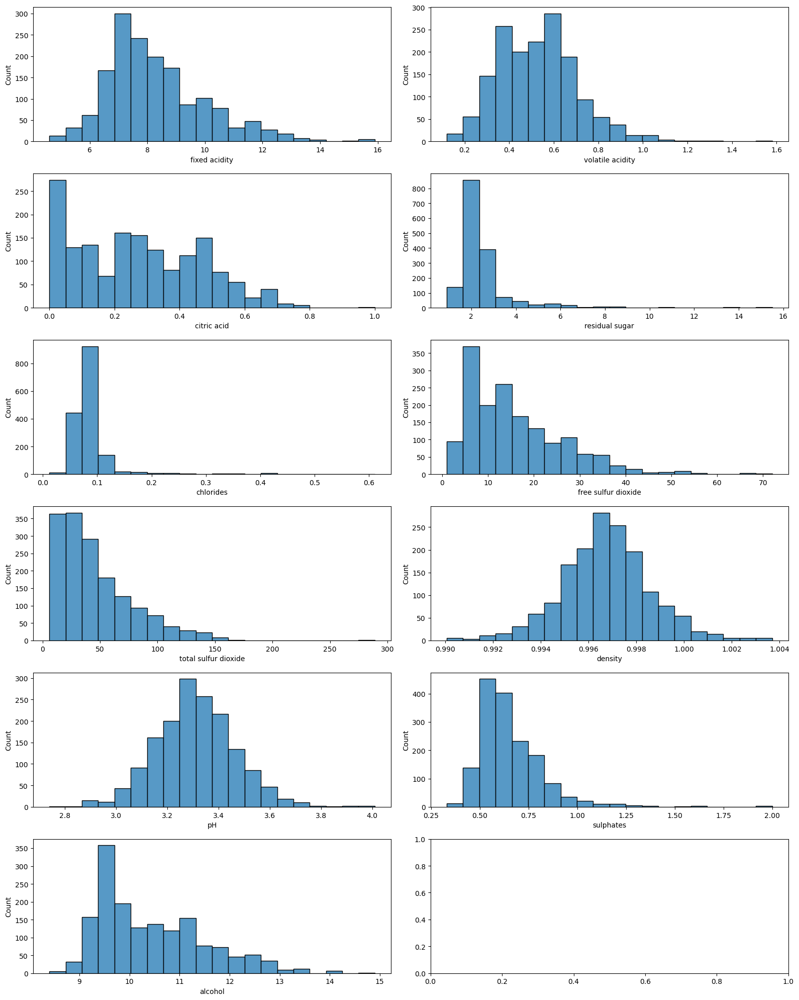

In [75]:
fig, ax = plt.subplots(6, 2, figsize=(16, 20))
ax = ax.flatten()
cols_disc = datos.select_dtypes(include=['float64'])
i = 0
for col in cols_disc.columns:
    sns.histplot(data=datos, x=col, ax=ax[i], bins=20, legend=None)
    i+=1
# Para que no se me junten
plt.tight_layout()
plt.show()

In [76]:
corr_matrix = datos.corr(numeric_only=True)
corr_matrix.style.background_gradient()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


In [77]:
# Dividir
y = datos['quality']
x = datos.drop('quality', axis=1)
train_set_x, test_set_x, train_set_y, test_set_y = train_test_split(x,y,
                            test_size=0.15, random_state=42, stratify=y)

#### Pipeline y SVR

In [83]:
pipe = SimpleImputer(strategy='mean')
modelo = make_pipeline(pipe,SVC(random_state=42))

# Entrenar
print('Entrenando SVC')
start = time.time()
modelo.fit(train_set_x, train_set_y)
time_train_origi = time.time() -start
print(f"Tiempo de entrenamiento sin PCA: {time_train_origi:.2f} segundos")

# Evaluar
pred_y_origi = modelo.predict(test_set_x)
exactutid = accuracy_score(test_set_y, pred_y_origi)
print('Exactitud: {}'.format(exactutid))


Entrenando SVC
Tiempo de entrenamiento sin PCA: 0.13 segundos
Exactitud: 0.4875


In [89]:
# Reducir dimensionalidad con PCA varianza 95%
pca = PCA(n_components=0.95)
X_train_reduced = pca.fit_transform(train_set_x)
X_test_reduced = pca.transform(test_set_x)

# Entrenar
print('Entrenando SVC con PCA')
start = time.time()
modelo.fit(X_train_reduced, train_set_y)
time_train_pca = time.time() -start
print(f"Tiempo de prueba PCA: {time_train_pca:.2f} segundos")

# Evaluar
pred_y_pca = modelo.predict(X_test_reduced)
exactutid = accuracy_score(test_set_y, pred_y_pca)
print('Exactitud: {}'.format(exactutid))

dimensiones  1359
Entrenando SVC con PCA
Tiempo de prueba PCA: 0.11 segundos
Exactitud: 0.48333333333333334


Conclusion:
El tiempo empleando PCA es menor que sin aplicarlo pero la exactitud tambien.
No son diferencias grandes pero cuanta menos varianza conservemos peor sera la exactitud

## EJERCICIO 4

Una empresa de coches ha sacado un nuevo modelo al mercado. Le ha preguntado a una red social quién ha comprado el producto, recaudando el sexo, la edad y el salario de cada uno de ellos. Ahora queremos construir un modelo que nos permita determinar con estos atributos si la persona comprará el producto o no, para tomar medidas en función de la respuesta para que lo acabe comprando.

Los datos están en el csv

### RECOPILACIÓN Y RECOLECCIÓN DE LOS DATOS

####  OBTENER LOS DATOS

In [68]:
datos = pd.read_csv("./compras.csv")
datos_copy = datos.copy()

#### EXPLORAR LOS DATOS 
Con exhaustividad: datos estadísticos, gráficos, correlaciones... e indicar las deduciones a las que llegas

In [69]:
datos.head()

,Identificador,Sexo,Edad,Salario,Compra
0,15624510,Hombre,19,19000,0
1,15810944,Hombre,35,20000,0
2,15668575,Mujer,26,43000,0
3,15603246,Mujer,27,57000,0
4,15804002,Hombre,19,76000,0


In [70]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Identificador  400 non-null    int64 
 1   Sexo           400 non-null    object
 2   Edad           400 non-null    int64 
 3   Salario        400 non-null    int64 
 4   Compra         400 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 15.8+ KB


In [71]:
datos.describe()

,Identificador,Edad,Salario,Compra
count,4.000000e+02,400.000000,400.000000,400.000000
mean,1.569154e+07,37.655000,69742.500000,0.357500
std,7.165832e+04,10.482877,34096.960282,0.479864
min,1.556669e+07,18.000000,15000.000000,0.000000
25%,1.562676e+07,29.750000,43000.000000,0.000000
50%,1.569434e+07,37.000000,70000.000000,0.000000
75%,1.575036e+07,46.000000,88000.000000,1.000000
max,1.581524e+07,60.000000,150000.000000,1.000000


/tmp/ipykernel_6902/3144679809.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  sns.countplot(data=datos, x=col, ax=ax[i], legend=None).set_xticklabels(labels=['No','Si'])


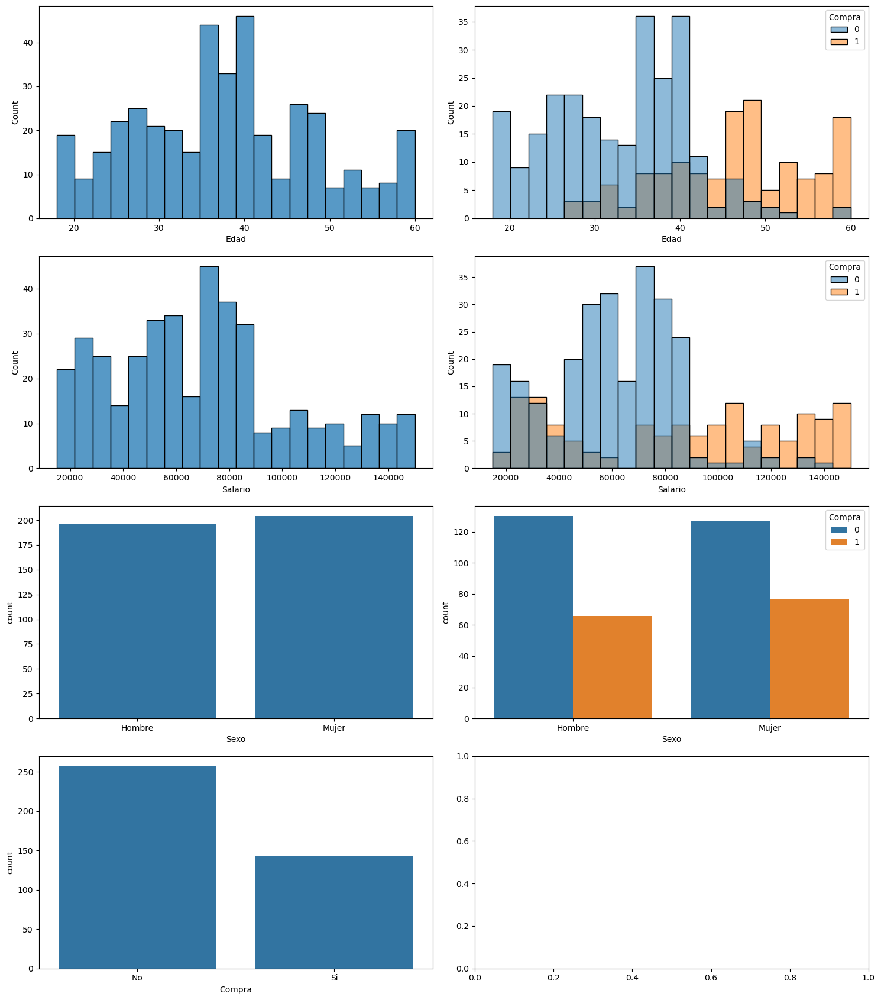

In [72]:
fig,ax = plt.subplots(4,2, figsize=(15,17))
ax = ax.flatten()   #para poder hacer ax[i] en vez de ax[i,j] porque el grafico se divide en más de una columna (4,2)    
cols_disc = ['Edad','Salario']
cols_cont = ['Sexo','Compra']
i = 0
for col in cols_disc:
    sns.histplot(data=datos, x=col, ax=ax[i], bins=20, legend=None)
    i+=1
    sns.histplot(data=datos, x=col, ax=ax[i], bins=20, hue='Compra')
    i+=1
for col in cols_cont:
    if col == 'Compra':
        sns.countplot(data=datos, x=col, ax=ax[i], legend=None).set_xticklabels(labels=['No','Si'])
        i+=1
    else:
        sns.countplot(data=datos, x=col, ax=ax[i], legend=None)
        i+=1
        sns.countplot(data=datos, x=col, ax=ax[i], hue='Compra')
        i+=1

plt.tight_layout()
plt.show()

In [73]:
#  Esto ya se ve arriba 
# g = sns.FacetGrid(datos, row='Compra', col='Sexo') 
# g.map(sns.countplot, 'Sexo')

In [74]:
datos['Compra'].value_counts()

Compra
0    257
1    143
Name: count, dtype: int64

In [75]:
# media de compras por salario
media_compra_salario = datos[['Compra','Salario']].groupby('Compra').mean()
media_compra_salario=media_compra_salario.sort_values(by='Compra',ascending=False)
media_compra_salario

,Salario
Compra,
1,86272.727273
0,60544.747082


In [76]:
# categorizo edad para ver mejor
datos['Edad_cat'] = pd.cut(datos['Edad'], 
                           bins=[-1,20,30,40,50,np.inf], 
                           labels=[1,2,3,4,5]).to_numpy().reshape(-1,1)  
datos['Edad_cat'].value_counts()

Edad_cat
3    142
4     98
2     92
5     49
1     19
Name: count, dtype: int64

In [77]:
# media de salario por edad
media_edad_salario = datos[['Edad_cat','Salario']].groupby('Edad_cat').mean()
media_edad_salario=media_edad_salario.sort_values(by='Edad_cat',ascending=False)
media_edad_salario

,Salario
Edad_cat,
5,81612.244898
4,68948.979592
3,72760.563380
2,62206.521739
1,57157.894737


Correlacion

In [78]:
corr_matrix = datos.corr(numeric_only=True)
corr_matrix['Compra'].sort_values(ascending=False)

Compra           1.000000
Edad             0.622454
Edad_cat         0.586512
Salario          0.362083
Identificador    0.007120
Name: Compra, dtype: float64

In [79]:
corr_matrix.style.background_gradient()

,Identificador,Edad,Salario,Compra,Edad_cat
Identificador,1.000000,-0.000721,0.071097,0.007120,-0.012721
Edad,-0.000721,1.000000,0.155238,0.622454,0.964552
Salario,0.071097,0.155238,1.000000,0.362083,0.156023
Compra,0.007120,0.622454,0.362083,1.000000,0.586512
Edad_cat,-0.012721,0.964552,0.156023,0.586512,1.000000


#### Conclusiones
- No hay nulos que tratar
- Identificador no me sirve, es solo un id, no tiene correlacion con nada
- El rango de edades oscila principalmente entre los 20 y 60 años pero solo los menores de 28 no han comprado ninguno
- Las compras representan algo más de la mitad 
- El salario ronda entre 40.000 y 90.000 

#### DIVIDIR LOS DATOS EN CONJUNTO DE ENTRENAMIENTO Y PRUEBAS

In [80]:
y = datos_copy['Compra']
x = datos_copy.drop('Compra', axis=1)
train_set_x, test_set_x, train_set_y, test_set_y = train_test_split(x,y,
                            test_size=0.15, random_state=42, stratify=y)

#### PREPARAR LOS DATOS
Algunas pistas a tener en cuenta (** esto no quiere decir que sólo haya que hacer esto**):
* No usar las características que no sirven
* Tratar los valores nulos (aunque ahora no haya)
* Edad: primeramente convertir en categórica poniendo las siguientes etiquetas y luego aplicar el cambio que procede en las variables categóricas (es para aplicar los diferentes tipos de transformaciones que hay, no porque tenga mucho sentido).
  * 0-20 --> Rango1
  * 20-30 --> Rango 2
  * 30-40 --> Rango 3
  * 40-50 --> Rango 4
  * 50- --> Rango 5

* Salario: aplicar logaritmo (aunque no tenga una cola larga a la derecha) y luego estandarizar

In [81]:

# metodos pipeline
def age_name(function_transformer, feature_names_in):
     return ['Edad']
def sex_name(function_transformer, feature_names_in):
     return ['Sexo']

def separar_age(X):
     X=pd.DataFrame(X,columns=['Edad'])
     X['Edad'] = pd.cut(X['Edad'], bins=[-1,20,30,40,50,np.inf], labels=[1,2,3,4,5]).to_numpy().reshape(-1,1)  #labels no admite str
     return X
def pasar_sex(X):
     return np.where(X == 'Hombre',1,0)


# pipelines
age_pipeline=make_pipeline(
     SimpleImputer(strategy='mean'),
     FunctionTransformer(separar_age,feature_names_out=age_name),
     StandardScaler()
)
salario_pipeline = make_pipeline(
     SimpleImputer(strategy='mean'),
     FunctionTransformer(np.log, feature_names_out="one-to-one"),
     StandardScaler()
)
sex_pipeline = make_pipeline(
     SimpleImputer(strategy='most_frequent'),
     FunctionTransformer(pasar_sex,feature_names_out=sex_name),
     StandardScaler()
)


# megapipeline
pipeline = ColumnTransformer([
     ('Sexo', sex_pipeline, ['Sexo']), 
     ('Salario', salario_pipeline, ['Salario']), 
     ('Edad', age_pipeline, ['Edad']) 
 ],
 verbose_feature_names_out=False
 )
 

#meter los datos a la pipeline
train_set_prep = pipeline.fit_transform(train_set_x)

#pasar los datos a dataframe
pipeline_column = pipeline.get_feature_names_out()   
df_train_set = pd.DataFrame(train_set_prep, columns=pipeline_column)
df_train_set.head()

,Sexo,Salario,Edad
0,-0.937258,-0.356416,-0.117850
1,1.066942,-2.183415,-1.049685
2,1.066942,-1.154502,-1.049685
3,1.066942,0.810125,-0.117850
4,-0.937258,-0.185974,-0.117850
